In [1]:
#importing required libraries and reading data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import geopandas as gpd
import scipy.stats as stats
import shapefile as shp
import plotly.express as px
import math
import plotly.graph_objects as go

df = pd.read_csv('train.csv')

In [2]:
df.info()
display(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29451 entries, 0 to 29450
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   POSTED_BY              29451 non-null  object 
 1   UNDER_CONSTRUCTION     29451 non-null  int64  
 2   RERA                   29451 non-null  int64  
 3   BHK_NO.                29451 non-null  int64  
 4   BHK_OR_RK              29451 non-null  object 
 5   SQUARE_FT              29451 non-null  float64
 6   READY_TO_MOVE          29451 non-null  int64  
 7   RESALE                 29451 non-null  int64  
 8   ADDRESS                29451 non-null  object 
 9   LONGITUDE              29451 non-null  float64
 10  LATITUDE               29451 non-null  float64
 11  TARGET(PRICE_IN_LACS)  29451 non-null  float64
dtypes: float64(4), int64(5), object(3)
memory usage: 2.7+ MB


,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5
...,...,...,...,...,...,...,...,...,...,...,...,...
29446,Owner,0,0,3,BHK,2500.000000,1,1,"Shamshabad Road,Agra",27.140626,78.043277,45.0
29447,Owner,0,0,2,BHK,769.230769,1,1,"E3-108, Lake View Recidency,,Vapi",39.945409,-86.150721,16.0
29448,Dealer,0,0,2,BHK,1022.641509,1,1,"Ajmer Road,Jaipur",26.928785,75.828002,27.1
29449,Owner,0,0,2,BHK,927.079009,1,1,"Sholinganallur,Chennai",12.900150,80.227910,67.0


In [3]:
#splitting the ADDRESS column into two columns (Locality and City) using the division (,)

df['City'] = df['ADDRESS'].str.split(',').str.get(-1)
df['Locality'] = df['ADDRESS'].str.split(',').str.get(-2)


#creating a list of unique cities
cities = df['City'].unique()

#As we split the address, some of the localities come out as '' (because of two commas), 
#we change the index of the splitting to fix this
for i in range(df.shape[0]):
    if(df.iat[i,13]) == '' :
        df.iat[i,13] = df.iat[i,8].split(',')[-3]

#clubbing the data by city
df.sort_values('City' , inplace = True)
df.reset_index(drop = False)

#dropping the redundant column address
df.drop('ADDRESS', axis = 1 , inplace=True)

#### Splitting the Address into Locality and City would help us divide the data, and individually analyze data for different cities. This division would create more correlations between the variables, and would avoid the data variations amongst different cities. 

In [4]:
df['City'] = df.replace({'City' : {'Maharashtra' : 'Mumbai'}})['City']
df1 = df
df1 = df1.drop('READY_TO_MOVE' , axis = 1)
#The localities of both of these so called cities are the same as that of mumbai, its better to replace both of these with mumbai
df['City'] = df.replace({'City' : {'Lalitpur' : 'Mumbai'}})['City']

print(df['City'].nunique())

254


#### We replace the so called cities "Maharashtra and Lalitpur" with "Mumbai",  as the localities were clearly the same as that of Mumbai.


In [5]:
#creating a new dataframe which contains total no. of localities (available data) for each city
city_locality_df=pd.DataFrame(columns =['City', 'Localities_no'], index = [x for x in range(254)])
i=0
for city in df['City'].unique():
    city_locality_df['City'][i]= city
    city_locality_df['Localities_no'][i]=len(df.loc[df['City']==city])
    i+=1

#we sort the dataframe in an ascending fashion to get the major cities on the top
city_locality_df=city_locality_df.sort_values(by="Localities_no", ascending=False)

display(city_locality_df)
major_cities=[]

#Creating a list of major cities (top 6)
for i in range(6):
    major_cities.append(city_locality_df.iloc[i,0])
    display(city_locality_df.iloc[i,:])

#we will now perform most of our EDAs on the top 6 major cities

,City,Localities_no
142,Mumbai,6595
21,Bangalore,4340
190,Pune,1991
170,Noida,1767
134,Kolkata,1709
...,...,...
141,Kurukshetra,1
136,Korba,1
123,Kangra,1
115,Jhunjhunu,1


City             Mumbai
Localities_no      6595
Name: 142, dtype: object

City             Bangalore
Localities_no         4340
Name: 21, dtype: object

City             Pune
Localities_no    1991
Name: 190, dtype: object

City             Noida
Localities_no     1767
Name: 170, dtype: object

City             Kolkata
Localities_no       1709
Name: 134, dtype: object

City             Chennai
Localities_no       1255
Name: 49, dtype: object

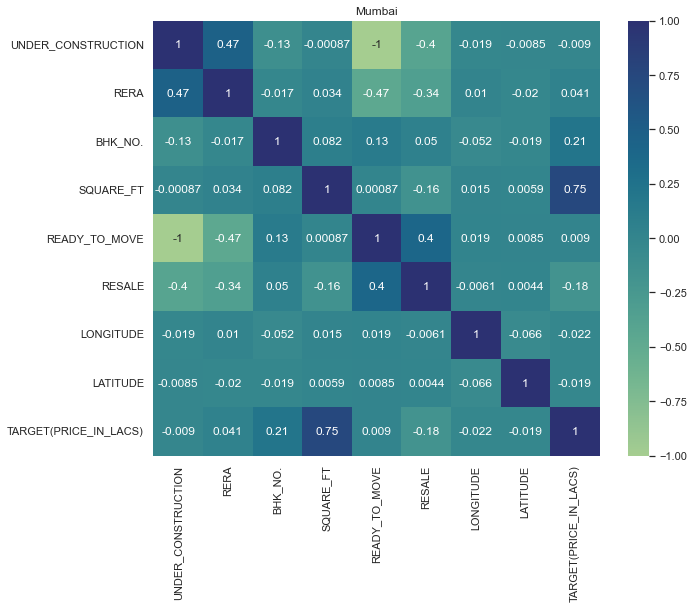

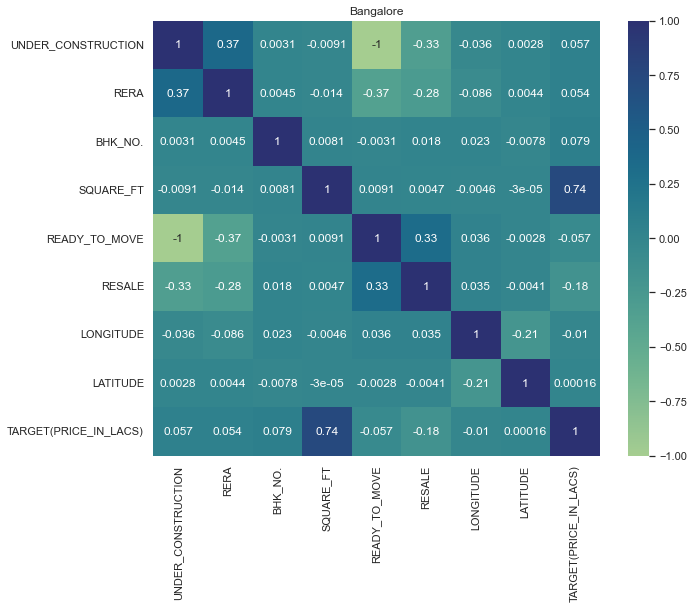

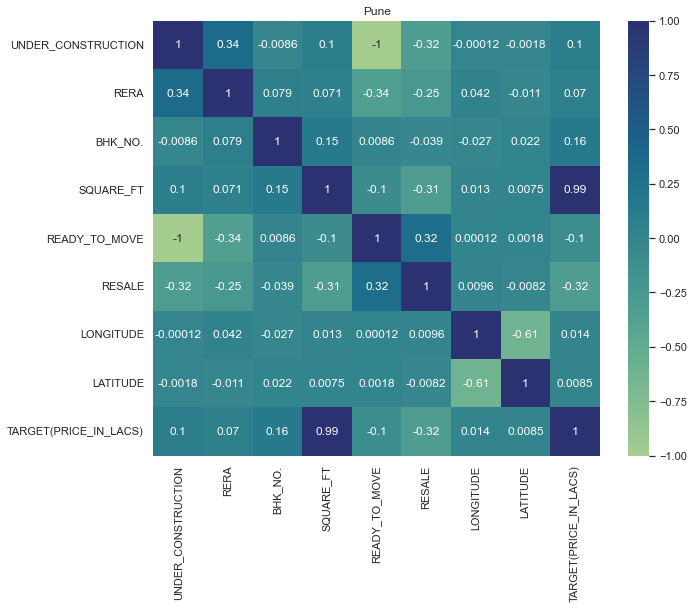

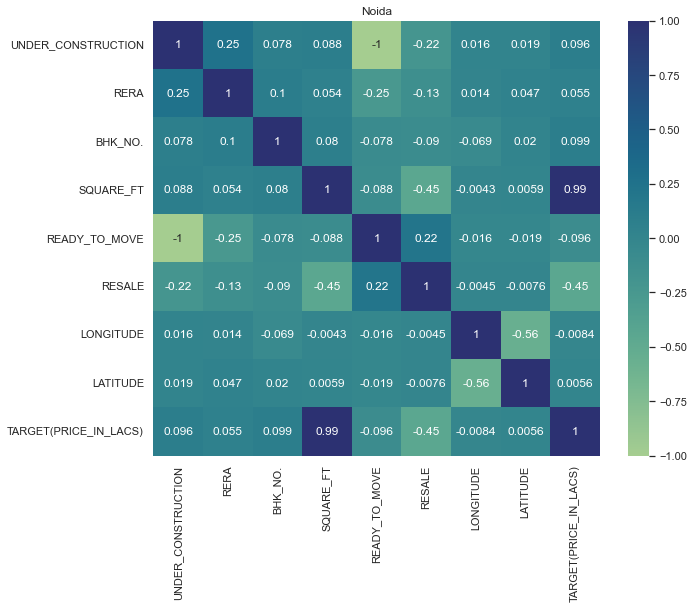

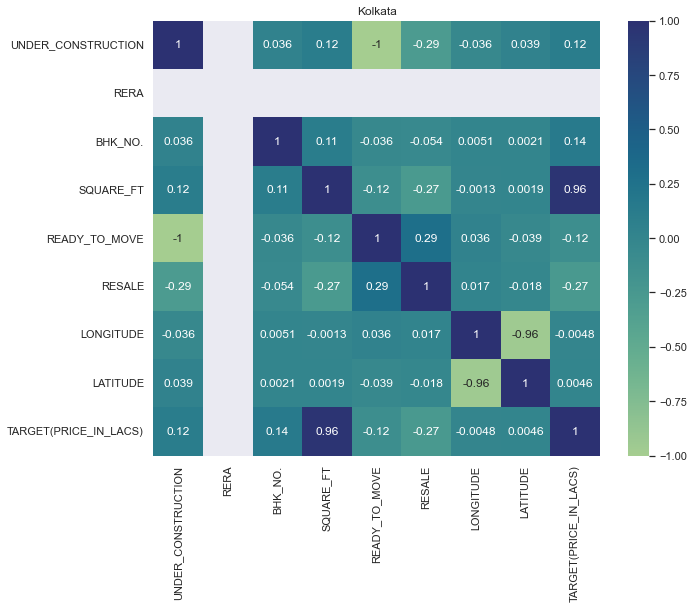

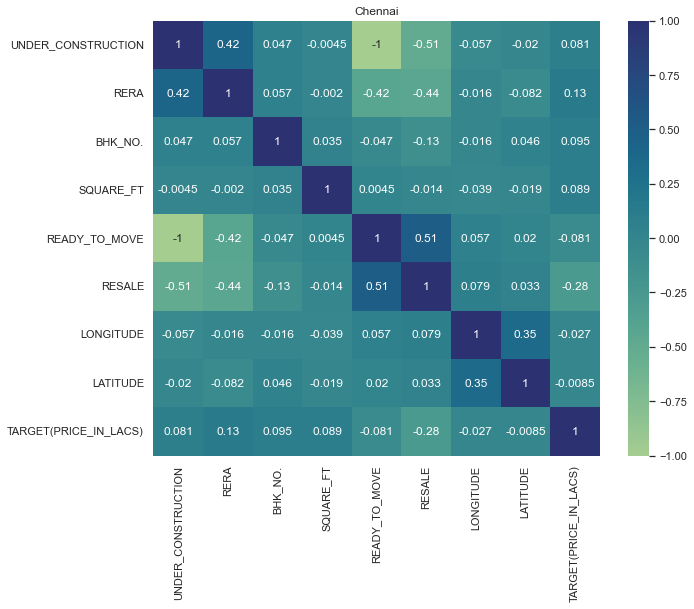

In [6]:
#plotting a heatmap to identify correlations between different variables
for city in major_cities:
    sb.set(rc = {'figure.figsize' : (10,8)})
    sb.heatmap(df.loc[df['City']==city].corr() , annot = True,cmap='crest')
    plt.title(city)
    plt.show()

### We plot correlation heatmaps to identify correlations between different variables. We conclude the variable square ft is highly correlated to the target variable (House Prices in lacs). we also observe the location that is Latitiude and Longitude are weakly correlated with all of the other variables, this is because firstly the latitude and longitude is almost the same for each cities, and there is a very unclear distribution of other variables with this variable. Also the variable Ready to move and Under construction are complementary, thus we can use one of the two variables to analyze our data.

In [7]:
#As READY_TO_MOVE and UNDER_CONSTRUCTION are complementary with -1 coefficient, we remove the READY_TO_MOVE column
df.drop('READY_TO_MOVE', axis = 1 , inplace=True)


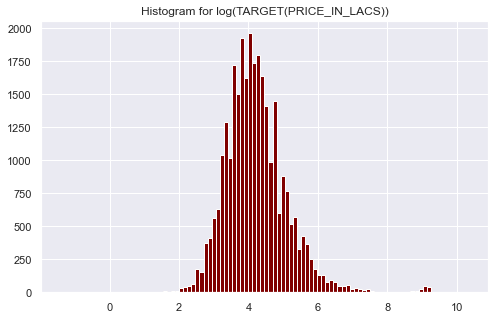

<AxesSubplot:title={'center':'Log Price Distribution'}, ylabel='Density'>

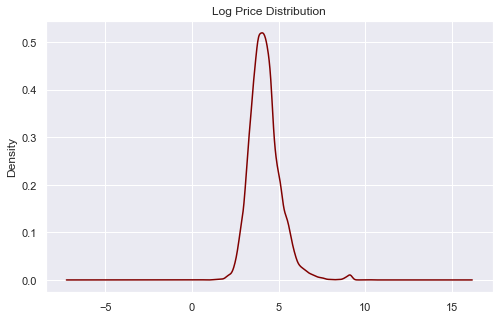

In [8]:
#plotting a histogram on the target (house prices)
df['Log_prices'] = np.log(df['TARGET(PRICE_IN_LACS)'])
f = plt.figure()
f.set_figwidth(8)
f.set_figheight(5)
plt.hist(df['Log_prices'], color='maroon',bins = 100)
plt.title('Histogram for log(TARGET(PRICE_IN_LACS))')
plt.show()

#plotting a continous log price distribution with density on the y axis
f = plt.figure()
f.set_figwidth(8)
f.set_figheight(5)
df['Log_prices'].plot(kind = 'density',color='maroon', title = 'Log Price Distribution')
#THESE PLOTS DO HELP US IDENTIFY THE OUTLIERS !!

### From the above plots we infer that the data is concentrated in the region e(2)  to e(6) lacs, we can remove the outliers by putting appropriate thresholds.

In [9]:
#plotting a scatter plot using plotly :) for house prices (target) vs Bhk number
fig = px.scatter(df, x = 'BHK_NO.', y='TARGET(PRICE_IN_LACS)', hover_name = 'City',title="House Prices vs BHK no.")
fig.show()


In [10]:
df['log_sq_ft'] = np.log(df['SQUARE_FT'])
fig = px.scatter(df , x = 'log_sq_ft', y = 'Log_prices', hover_name = 'City', title=' Log Prices vs Log Area')
fig.show()

#THESE PLOTS DO HELP US IDENTIFY THE OUTLIERS (PART 2) !!

### We remove the outliers using the idea of the concentration of the data, and by logical interpretaion.

In [11]:
#Removing the outliers by putting appropriate thresholds
df = df.loc[(df['TARGET(PRICE_IN_LACS)'] < 1000)]
df = df.loc[(df['BHK_NO.']  <  7)]

#Also we observe certain outliers in the square feet column
#e^9 it is
df = df.loc[(df['SQUARE_FT'] < 11000)]
df = df.loc[(df['SQUARE_FT'] > 100)]


In [12]:
f = plt.figure()
f.set_figwidth(8)
f.set_figheight(5)
#we plot the graphs without the outliers
fig = px.scatter(df , x = 'BHK_NO.', y = 'TARGET(PRICE_IN_LACS)', hover_name = 'City', title='House Prices vs Bhk no.')
fig.show()

<Figure size 576x360 with 0 Axes>

In [13]:
#plotting a scatter plot of log of the house prices vs log of the area of the houses
df['log_sq_ft'] = np.log(df['SQUARE_FT'])
fig = px.scatter(df , x = 'log_sq_ft', y = 'Log_prices', hover_name = 'City', title=' Log Prices vs Log Area')
fig.show()

In [14]:
for col in df:
    #entropy is calculated for a column, so must be initialized to zero for every column
    entropy=0 
    #now under column, we iterate along the unique values in that column
    for ent in df[col].unique(): 
        #probability p (for that selected unqiue value) needed to find entropy
        p= len(df.loc[df[col]==ent])/len(df[col]) 
         #summing up these values in the for loop
        entropy+= p*(math.log(p))*(-1) 
    print("The Entropy for Variable " + col +": " + str(entropy))

The Entropy for Variable POSTED_BY: 0.7454175684242643
The Entropy for Variable UNDER_CONSTRUCTION: 0.46957484123916865
The Entropy for Variable RERA: 0.6247028459739663
The Entropy for Variable BHK_NO.: 1.1813521668116858
The Entropy for Variable BHK_OR_RK: 0.00669192492075164
The Entropy for Variable SQUARE_FT: 9.372058517410665
The Entropy for Variable RESALE: 0.2443662833208293
The Entropy for Variable LONGITUDE: 6.936134510520215
The Entropy for Variable LATITUDE: 6.931317293540308
The Entropy for Variable TARGET(PRICE_IN_LACS): 5.4442113712937
The Entropy for Variable City: 3.257185362849602
The Entropy for Variable Locality: 7.54587990474624
The Entropy for Variable Log_prices: 5.4442113712937
The Entropy for Variable log_sq_ft: 9.372058517410665


### Entropy is related to the randomness of the data being processed, that is higher the entropy higher is the randomness in the data (meaningful for discrete datatypes). Higher the randomness(entropy) of a variable , harder it is to draw conclusions from the variable. This lets us know the randomness in the all of the variables. 

In [15]:
for city in major_cities:
    #displaying mean,standard deviation, quartiles, min and max for every column(variable) in the dataframe 
    display(df.loc[df['City']==city].describe())

,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Log_prices,log_sq_ft
count,6383.000000,6383.000000,6383.000000,6383.000000,6383.000000,6383.000000,6383.000000,6383.000000,6383.000000,6383.000000
mean,0.289206,0.477205,2.084756,1064.008932,0.877957,20.751427,73.973666,164.154441,4.787812,6.859770
std,0.453429,0.499519,0.830433,580.673181,0.327361,3.228738,8.423981,149.767796,0.787460,0.460229
min,0.000000,0.000000,1.000000,196.942082,0.000000,4.575000,-87.681841,3.500000,1.252763,5.282910
25%,0.000000,0.000000,2.000000,677.287276,1.000000,19.049214,72.867500,74.500000,4.310799,6.518095
50%,0.000000,0.000000,2.000000,999.000999,1.000000,19.180000,72.981527,120.000000,4.787492,6.906756
75%,1.000000,1.000000,3.000000,1250.000000,1.000000,21.294140,76.153691,200.000000,5.298317,7.130899
max,1.000000,1.000000,6.000000,10732.758620,1.000000,42.049481,127.068387,990.000000,6.897705,9.281056


,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Log_prices,log_sq_ft
count,4294.000000,4294.000000,4294.000000,4294.000000,4294.000000,4294.000000,4294.000000,4294.000000,4294.000000,4294.000000
mean,0.124592,0.262692,2.550536,1503.008139,0.960410,13.945159,77.738432,103.235347,4.406131,7.235404
std,0.330295,0.440148,0.675092,711.968120,0.195017,5.100102,12.470876,91.636044,0.636899,0.382185
min,0.000000,0.000000,1.000000,124.947224,0.000000,-37.713008,-85.766122,0.480000,-0.733969,4.827891
25%,0.000000,0.000000,2.000000,1106.056647,1.000000,12.905538,77.585721,55.000000,4.007333,7.008556
50%,0.000000,0.000000,3.000000,1315.212626,1.000000,12.969910,77.607396,76.000000,4.330733,7.181754
75%,0.000000,1.000000,3.000000,1670.944840,1.000000,13.030600,77.697963,110.000000,4.700480,7.421145
max,1.000000,1.000000,6.000000,10410.958900,1.000000,52.556894,144.957843,970.000000,6.877296,9.250614


,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Log_prices,log_sq_ft
count,1975.000000,1975.000000,1975.000000,1975.000000,1975.000000,1975.000000,1975.000000,1975.000000,1975.000000,1975.000000
mean,0.189367,0.412658,2.160506,1198.155646,0.955443,18.907334,73.775169,87.347924,4.233410,6.970210
std,0.391899,0.492437,0.801506,716.649061,0.206381,2.038326,3.709667,78.941822,0.644702,0.457957
min,0.000000,0.000000,1.000000,220.005867,0.000000,13.022485,7.680335,12.000000,2.484907,5.393654
25%,0.000000,0.000000,2.000000,768.574528,1.000000,18.510100,73.775880,44.300000,3.790974,6.644537
50%,0.000000,0.000000,2.000000,1050.044683,1.000000,18.556218,73.847780,66.000000,4.189655,6.956588
75%,0.000000,1.000000,3.000000,1349.998312,1.000000,18.618200,73.931040,99.000000,4.595120,7.207859
max,1.000000,1.000000,6.000000,6005.605232,1.000000,45.073846,83.781980,850.000000,6.745236,8.700449


,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Log_prices,log_sq_ft
count,1755.000000,1755.000000,1755.000000,1755.000000,1755.000000,1755.000000,1755.000000,1755.000000,1755.000000,1755.000000
mean,0.139601,0.539601,2.678632,1576.538892,0.980057,28.465675,77.089630,89.121031,4.274829,7.260338
std,0.346672,0.498571,0.770297,834.326908,0.139844,1.080748,7.169307,71.402707,0.629974,0.437921
min,0.000000,0.000000,1.000000,287.997027,0.000000,19.344689,-114.053121,8.000000,2.079442,5.662950
25%,0.000000,0.000000,2.000000,1082.159669,1.000000,28.506454,77.370417,49.000000,3.891820,6.986714
50%,0.000000,1.000000,3.000000,1390.176089,1.000000,28.558047,77.386300,70.000000,4.248495,7.237186
75%,0.000000,1.000000,3.000000,1750.174154,1.000000,28.577673,77.409568,100.000000,4.605170,7.467471
max,1.000000,1.000000,5.000000,10891.488500,1.000000,46.909674,77.481711,750.000000,6.620073,9.295737


,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Log_prices,log_sq_ft
count,1698.000000,1698.0,1698.000000,1698.000000,1698.000000,1698.000000,1698.000000,1698.000000,1698.000000,1698.000000
mean,0.161955,0.0,2.566549,1238.796626,0.965253,22.679281,87.026900,71.307597,3.955871,7.031372
std,0.368518,0.0,0.721331,628.875054,0.183192,1.614312,14.754162,79.723503,0.720129,0.405043
min,0.000000,0.0,1.000000,300.000000,0.000000,12.956863,-86.152929,8.000000,2.079442,5.703782
25%,0.000000,0.0,2.000000,850.099178,1.000000,22.499161,88.337780,30.750000,3.425886,6.745353
50%,0.000000,0.0,3.000000,1100.110011,1.000000,22.541110,88.363181,47.100000,3.852271,7.003165
75%,0.000000,0.0,3.000000,1400.289872,1.000000,22.592200,88.430400,80.000000,4.382027,7.244435
max,1.000000,0.0,6.000000,9000.000000,1.000000,40.671972,88.995434,950.000000,6.856462,9.104980


,UNDER_CONSTRUCTION,RERA,BHK_NO.,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),Log_prices,log_sq_ft
count,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000,1238.000000
mean,0.122779,0.164782,2.231826,1091.712133,0.879645,13.386654,80.414437,66.491761,3.981370,6.915499
std,0.328316,0.371134,0.710509,507.574384,0.325508,2.008696,2.681878,67.552602,0.584875,0.385006
min,0.000000,0.000000,1.000000,360.023041,0.000000,9.182037,72.769361,12.000000,2.484907,5.886168
25%,0.000000,0.000000,2.000000,797.307473,1.000000,12.925027,80.137200,36.000000,3.583519,6.681240
50%,0.000000,0.000000,2.000000,981.914224,1.000000,13.019638,80.191300,49.800000,3.908013,6.889504
75%,0.000000,0.000000,3.000000,1283.403673,1.000000,13.090000,80.240900,73.900000,4.302710,7.157270
max,1.000000,1.000000,6.000000,7075.471698,1.000000,30.128184,102.136839,960.000000,6.866933,8.864389


In [16]:
#Plotting scatter plots of Area(sq.ft) vs Target (House Price) vs localities using plotly express for the top 6 major cities
for cities in major_cities:
    city = df.loc[df['City'] == cities]
    fig = px.scatter( city, x = 'Locality', color = 'TARGET(PRICE_IN_LACS)', size = 'SQUARE_FT', title = cities,width = 1000, height = 800)
    fig.show()

### From the above plots we can conclude that the house prices are highly dependent on the localities, and also generally higher the area of the houses higher is the house prices. We also observe that Mumbai has a higher range of house prices, and has more houses with higher prices (higher prices are defined by the color scale).

In [17]:
# creating a list that stores total number of houses per BHK in every city
houses_per_bhk = []
# creating a list with unique values of 'BHK_NO.'
bhk_no = [1,2,3,4,5,6]
# creating a list which contains color scheme for the pie plot
colors = ['Navy' , 'Blue' , 'DodgerBlue' , 'DeepSkyBlue' , 'Cyan' , 'White']

# iterating over cities and obtaining the count of houses
for city in major_cities:
    count = []

    for bhk in bhk_no:
        y=len(df.loc[df['City']==city].loc[df['BHK_NO.']==bhk])
        count.append(y)
    houses_per_bhk.append(count)

# using plotly.graph_objects to make pie_plot 
# Adding traces to the same figure and passing argument visible : False to all except one
fig = go.Figure()
fig.add_traces(go.Pie( values = houses_per_bhk[0] , labels = bhk_no , name = 'Mumbai' , visible = True , hole = 0.3))
fig.add_traces(go.Pie( values = houses_per_bhk[1] , labels = bhk_no , name = 'Bangalore', visible = False , hole = 0.3))
fig.add_traces(go.Pie( values = houses_per_bhk[2] , labels = bhk_no , name = 'Pune' ,visible = False , hole = 0.3))
fig.add_traces(go.Pie( values = houses_per_bhk[3] , labels = bhk_no , name = 'Noida' ,visible = False , hole = 0.3))
fig.add_traces(go.Pie( values = houses_per_bhk[4] , labels = bhk_no , name = 'Kolkata' ,visible = False , hole = 0.3))
fig.add_traces(go.Pie( values = houses_per_bhk[5] , labels = bhk_no , name = 'Chennai' ,visible = False , hole = 0.3))

# change color scheme to the list created above
fig.update_traces(marker = dict(colors = colors))

# creating custom buttons by passing the list "visible" in args, which decides which pie_plot to show and setting the label
# (button name) to the city name for convenience. We set the method to 'update' as we change the data in every new plot and not the layout
my_button = list(
[
dict( args = [{"visible": [True, False, False, False , False , False]} ] , label = "Mumbai" , method = 'update' ),
dict(args = [ {"visible": [False, True, False, False , False , False]}]  , label = "Bangalore" , method = 'update'),   
dict(args = [ {"visible": [False, False, True, False , False , False]}]  , label = "Pune" , method = 'update'),   
dict(args = [ {"visible": [False, False, False, True , False , False]}]  , label = "Noida" , method = 'update'),   
dict(args = [  {"visible": [False, False, False, False , True , False]}]  , label = "Kolkata" , method = 'update'),
dict(args = [  {"visible": [False, False, False, False , False , True]}]  , label = "Chennai" , method = 'update') 

])

# setting the arguments in 'updatemenus' by choosing type as 'dropdown' and deciding the size and location of the button
# updating layout with the custom buttons created above
fig.update_layout(
    updatemenus = [dict(type = 'dropdown' , buttons = my_button , direction = 'down',
                       pad = {'r':0.5 , 't':0.5},
                       showactive = True,
                        xanchor = 'left' , x = -0.1,
                        yanchor = 'top' , y = 1,
                       )]
    
)
# show the figure
fig.update_layout(legend_title_text='BHK_No.')
fig.show()

### From the pie plots it can be concluded that the number of 5 and 6-BHK houses are fewer in number.  Generally upto 85-90 % of the houses are 1,2 or 3-BHK.  Almost 50% of the houses are 2-BHK except in Noida.  While all the cities have very few or no 6-BHK houses , Mumbai has 12 6-BHK houses.

In [18]:
#Building a dataframe which contains the House price average for each BHK_no. in each city
Majcity_bhk = pd.DataFrame(columns = ['BHK_NO.','Target','City'], index = [x for x in range(5*df['BHK_NO.'].nunique())])

#i is a index
i=0
for city in major_cities:
    #creates a temporary dataframe which selects data for a city
    dfc=df.loc[df['City']==city]
    
    #looping around all of the BHK_NO. unique values to get average house prices for each in a prticular city
    for j in range(1,7):
        
        #filling the new dataframe Majcity_bhk
        Majcity_bhk.loc[i,'BHK_NO.']=j
        Majcity_bhk.loc[i,'City']=city
        
        #avoiding input of NaN in the new dataframe by using if else condition
        if (len(dfc.loc[dfc['BHK_NO.']==j]==0)):
            Majcity_bhk.loc[i,'Target']= (dfc.loc[dfc['BHK_NO.']==j,'TARGET(PRICE_IN_LACS)'].sum())/len(dfc.loc[dfc['BHK_NO.']==j])
        else:
            Majcity_bhk.loc[i,'Target']= 0
        i+=1
        
display(Majcity_bhk)

#plotting a multiple line graph for each city showing the average House prices (Target) for every unique BHK_NO. 
fig = px.line(Majcity_bhk, x='BHK_NO.', y='Target', color='City',title="Average BHK price in Major Cities" , markers = True)
fig.show()

,BHK_NO.,Target,City
0,1,64.278049,Mumbai
1,2,134.264692,Mumbai
2,3,261.781568,Mumbai
3,4,522.020339,Mumbai
4,5,557.241379,Mumbai
5,6,617.066667,Mumbai
6,1,43.202941,Bangalore
7,2,62.889498,Bangalore
8,3,119.844901,Bangalore
9,4,292.914498,Bangalore


### The above plot is a multiple line plot for average House price (target) vs BHK No. . We observe that Mumbai> Pune>Bangalore> Chennai ~ Kolkata in house prices. Also our dataset consists of less and bad data for 5-6 Bhk houses for the cities Chennai and Noida. We can also conclude that the house prices generally increase with the increase in the Bhk no.

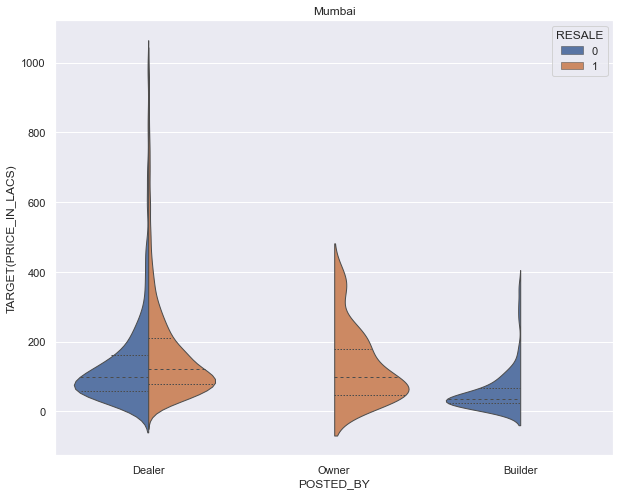

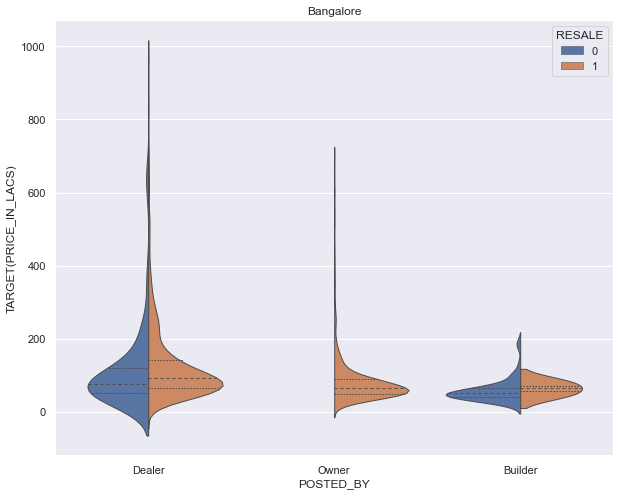

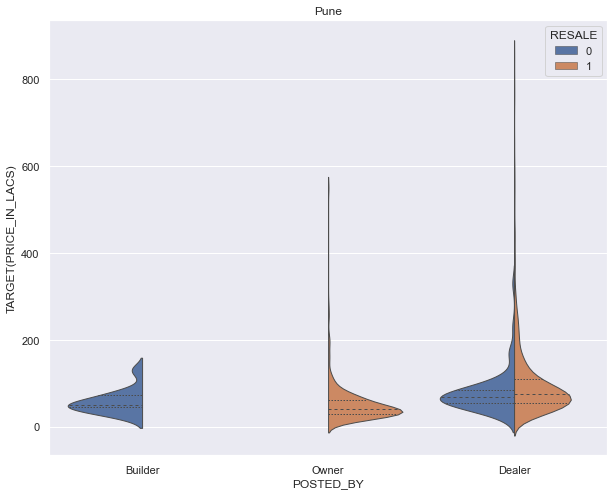

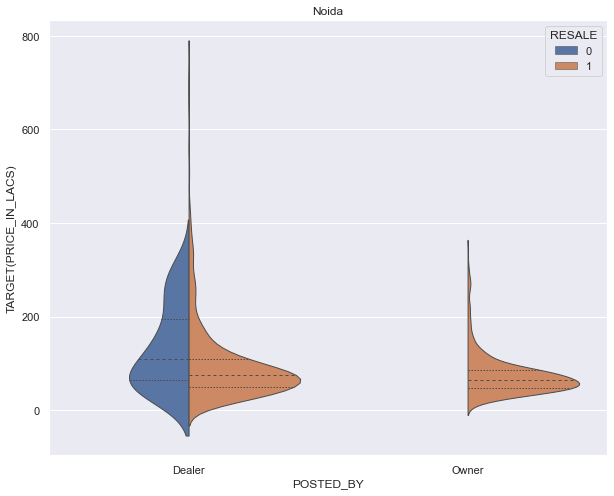

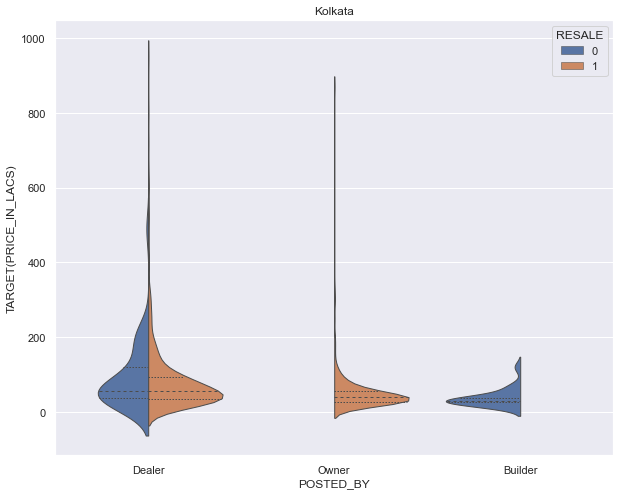

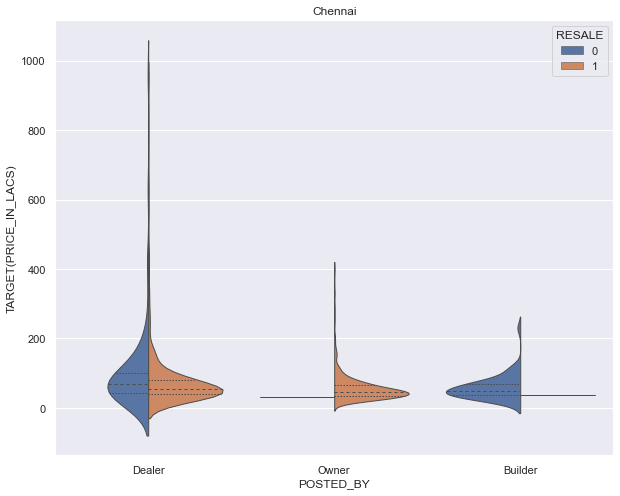

In [19]:
#plotting vioilin plots for each of the major cities
#Gives us relation between resale , posted by and the Target variable
for city in major_cities:
    sb.violinplot(data=df.loc[df['City']==city], x="POSTED_BY", y="TARGET(PRICE_IN_LACS)", hue="RESALE" ,split=True, inner="quart",height=100, linewidth=1,title=city)
    plt.title(city)
    plt.show()

In [20]:
# creating a new data frame that contains the required data
bar_plot = pd.DataFrame(columns = ['City', '% of houses under Construction' , 'UNDER_CONSTRUCTION'])

for city in major_cities:
    # obtaining percentage of houses under construction in each city
    under_const = (len(df.loc[df['City'] == city].loc[df['UNDER_CONSTRUCTION'] == 1].index) * 100 /len(df.loc[df['City'] == city].index))
    not_under_const = 100 - under_const
    new_row = [city , under_const , 'Yes' ]
    new_row_2 = [city , not_under_const , 'No' ]
    # adding new rows (essentially lists) to bar_plot dataframe, which contains data as per the columns.
    bar_plot.loc[len(bar_plot.index)] = new_row
    bar_plot.loc[len(bar_plot.index)] = new_row_2
    
#using that dataframe to get the stacked bar plot of percentage of houses under construction in top 6 cities
#We have used plotly library which allows us to customize the plot and see the exact percentage when we hover the cursor over the bar
fig = px.bar(bar_plot , x = 'City' , y = '% of houses under Construction' , color = 'UNDER_CONSTRUCTION' ,color_discrete_map={
                "Yes": "RebeccaPurple", "No": "MediumPurple"} ,  height = 450 , width = 750)
fig.show()

### We can observe that only 13-29 % of houses are under construction in the major cities. Particularly Mumbai city has the highest percentage ~ 29 % of houses under construction, and bangalore having the least ~ 13% as according to the given data.

In [21]:
#we create different dataframes for each of the major cities 
#makes work easier as we use geopandas to plot data on the map :) !

mdf=df.loc[df['City']=='Mumbai']
bdf=df.loc[df['City']=='Bangalore']
pdf=df.loc[df['City']=='Pune']
cdf=df.loc[df['City']=='Chennai']
kdf=df.loc[df['City']=='Kolkata']
ndf=df.loc[df['City']=='Noida']

frames = [mdf , bdf , ndf , pdf , kdf, cdf]
df_new = pd.concat(frames)

Text(0.5, 1.0, 'House Prices in Noida')

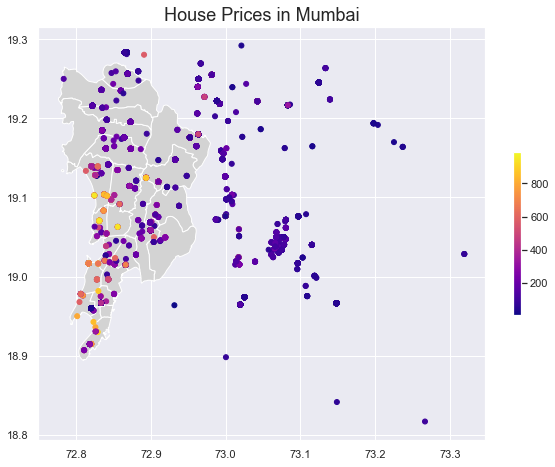

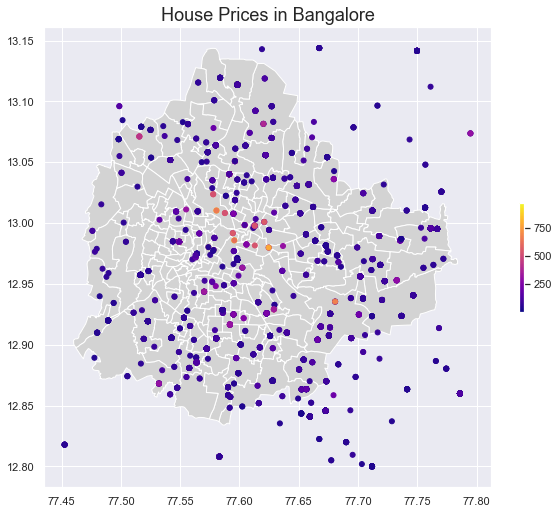

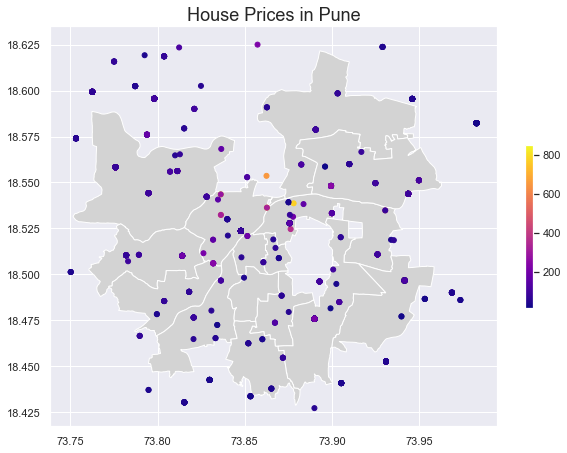

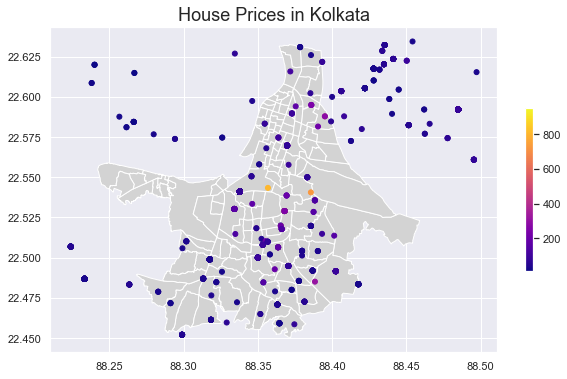

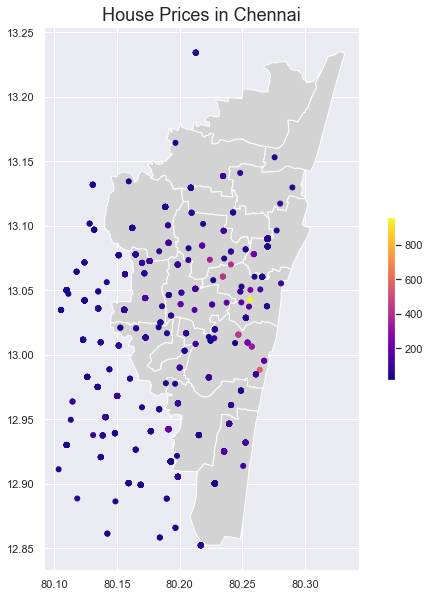

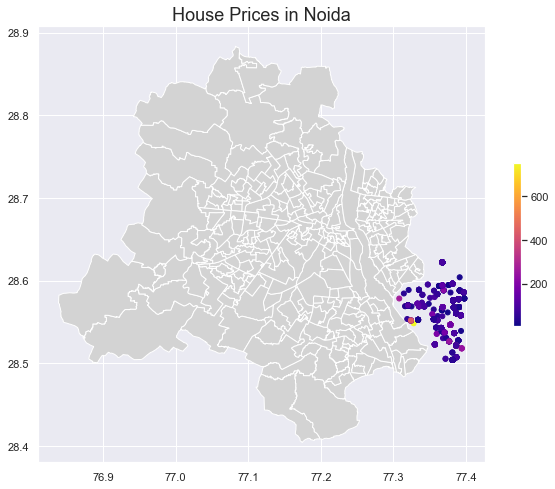

In [22]:
from matplotlib import cm

#looking at the shp files of the major cities we decide latitude longitude ranges which the map covers, to avoid large outliers
mdf = mdf.loc[(df['LATITUDE'] < 73.4)]
mdf = mdf.loc[(df['LONGITUDE']  < 19.3)]
mdf = mdf.loc[(df['LATITUDE'] > 72.75)]
mdf = mdf.loc[(df['LONGITUDE']  > 18.8)]

#for mumbai
#reading the shp file using geopandas
mumbai_shp = gpd.read_file('Mumbaishp.shp')
df_mumbai = gpd.GeoDataFrame(mdf , geometry = gpd.points_from_xy(mdf['LATITUDE'] , mdf['LONGITUDE']) ,  crs = "EPSG:4326" )

#plotting points on the map with price (color scale)
fig, ax = plt.subplots(figsize = (10,10))
mumbai_shp.plot(ax=ax, color='lightgrey')
df_mumbai.plot(column = 'TARGET(PRICE_IN_LACS)', ax=ax, cmap = 'plasma',
            legend = True, legend_kwds={'shrink': 0.3}, 
            markersize = 25 )
ax.set_title('House Prices in Mumbai'  , fontsize = 18)

#for bangalore
bdf = bdf.loc[(df['LATITUDE'] < 77.80)]
bdf = bdf.loc[(df['LONGITUDE']  < 13.15)]
bdf = bdf.loc[(df['LATITUDE'] > 77.45)]
bdf = bdf.loc[(df['LONGITUDE']  > 12.80)]
#reading the shp file
shapefile = gpd.read_file('BBMP.shp')
df_bdf = gpd.GeoDataFrame(bdf , geometry = gpd.points_from_xy(bdf['LATITUDE'] , bdf['LONGITUDE']) ,  crs = "EPSG:4326" )

#plotting points on the bangalore map with the color describing the house price(target)
fig, ax = plt.subplots(figsize = (10,10))
shapefile.plot(ax=ax, color='lightgrey')
df_bdf.plot(column = 'TARGET(PRICE_IN_LACS)', ax=ax, cmap = 'plasma',
            legend = True, legend_kwds={'shrink': 0.2}, 
            markersize = 25 )
ax.set_title('House Prices in Bangalore' , fontsize = 18)
plt.savefig('Heat Map')

#for pune
pdf = pdf.loc[(df['LATITUDE'] < 74.0)]
pdf = pdf.loc[(df['LONGITUDE']  < 18.625)]
pdf = pdf.loc[(df['LATITUDE'] > 73.75)]
pdf = pdf.loc[(df['LONGITUDE']  > 18.425)]

pune_shp = gpd.read_file('pune.shp')
df_pune = gpd.GeoDataFrame(pdf , geometry = gpd.points_from_xy(pdf['LATITUDE'] , pdf['LONGITUDE']) ,  crs = "EPSG:4326" )

fig, ax = plt.subplots(figsize = (10,10))
pune_shp.plot(ax=ax, color='lightgrey')
df_pune.plot(column = 'TARGET(PRICE_IN_LACS)', ax=ax, cmap = 'plasma',
            legend = True, legend_kwds={'shrink': 0.3}, 
            markersize = 25 )
ax.set_title('House Prices in Pune' , fontsize = 18)

#for kolkata
kdf = kdf.loc[(df['LATITUDE'] < 88.5)]
kdf = kdf.loc[(df['LONGITUDE']  < 22.635)]
kdf = kdf.loc[(df['LATITUDE'] > 88.2)]
kdf = kdf.loc[(df['LONGITUDE']  > 22.445)]

kolkata_shp = gpd.read_file('kolkata.shp')
df_kolkata = gpd.GeoDataFrame(kdf , geometry = gpd.points_from_xy(kdf['LATITUDE'] , kdf['LONGITUDE']) ,  crs = "EPSG:4326" )

fig, ax = plt.subplots(figsize = (10,10))
kolkata_shp.plot(ax=ax, color='lightgrey')
df_kolkata.plot(column = 'TARGET(PRICE_IN_LACS)', ax=ax, cmap = 'plasma',
            legend = True, legend_kwds={'shrink': 0.3}, 
            markersize = 25 )
ax.set_title('House Prices in Kolkata' ,fontsize = 18)

#for chennai
cdf = cdf.loc[(df['LATITUDE'] < 80.33)]
cdf = cdf.loc[(df['LONGITUDE']  < 13.25)]
cdf = cdf.loc[(df['LATITUDE'] > 80.1)]
cdf = cdf.loc[(df['LONGITUDE']  > 12.85)]

chennai_shp = gpd.read_file('Chennaizone.shp')
df_chennai = gpd.GeoDataFrame(cdf , geometry = gpd.points_from_xy(cdf['LATITUDE'] , cdf['LONGITUDE']) ,  crs = "EPSG:4326" )

fig, ax = plt.subplots(figsize = (10,10))
chennai_shp.plot(ax=ax, color='lightgrey')
df_chennai.plot(column = 'TARGET(PRICE_IN_LACS)', ax=ax, cmap = 'plasma',
            legend = True, legend_kwds={'shrink': 0.3}, 
            markersize = 25 )
ax.set_title('House Prices in Chennai' , fontsize = 18)

#for noida 
ndf = ndf.loc[(df['LATITUDE'] < 77.4)]
ndf = ndf.loc[(df['LONGITUDE']  < 28.9)]
ndf = ndf.loc[(df['LATITUDE'] > 76.8)]
ndf = ndf.loc[(df['LONGITUDE']  > 26.3)]

#due to unavailability of the shp file for noida we use the shp file of delhi
noida_shp = gpd.read_file('Delhi.shp')
df_noida = gpd.GeoDataFrame(ndf , geometry = gpd.points_from_xy(ndf['LATITUDE'] , ndf['LONGITUDE']) ,  crs = "EPSG:4326" )

fig, ax = plt.subplots(figsize = (10,10))
noida_shp.plot(ax=ax, color='lightgrey')
df_noida.plot(column = 'TARGET(PRICE_IN_LACS)', ax=ax, cmap = 'plasma',
            legend = True, legend_kwds={'shrink': 0.3}, 
            markersize = 25 )
ax.set_title('House Prices in Noida'  , fontsize = 18)


### We use Geopandas to plot points on the shp file for each of the major cities, using CRS of latitudes and longitudes. The color of the points describe the house price according to the color scale given in the plot. 
### We observe that in Mumbai most of the high valued houses (price) are located in the southern part of mumbai (600 to 850 lacs). Also there are points present out of the map, this is because the shp file does not contain Navi Mumbai and thane, and houses here are generally cheaper than that in current map.
### We observe that in bangalore most of the high valued houses(price) are located in the central part of bangalore (600 - 800 lacs), also house prices comparatively are lower than that of mumbai and are concentrated between 50 - 300 lacs. 
### We observe that in Pune high valued houses are located in the top central part of Pune (700-850 lacs) , also that the avg house prices is closer to that of bangalore ( we comment on this by looking at the color of the points). It can also be seen data for pune is less.
### We observe that in Kolkata majority of houses lie in the range of 0 to 250 lacs, and some of the high priced houses are in the central part of kolkata having price in the range of 600-800 lacs.
### We observe that in Chennai high priced houses are located in the central right region of chennai, though less in number ( because of less amount of data).
### For Noida we used the shp file of Delhi (unavailability of Noida shp file), we observe that higher priced houses are located in the west of Noida (closer to Delhi) and are less in number.


In [23]:
#plotting a box plot grouped by the variable RERA for each major city vs House prices
fig = px.box(df_new, x= 'City' , y='TARGET(PRICE_IN_LACS)', color= 'RERA')
fig.show()

### From the boxplots, we observe that the average prices of houses that have been registered and approved under RERA are higher than those which have been not in Mumbai, Bangalore, Chennai and Noida and almost same in Pune. This is because getting the approval adds to compliance cost and increases the overall cost of the project by roughly 10%

# Machine Learning

## Feature Engineering and Pre Processing of Data (for ML)

In [24]:
pune = df1.loc[df1['City'] == 'Pune']
mumbai = df1.loc[df1['City'] == 'Mumbai']
bangalore = df1.loc[df1['City'] == 'Bangalore']

#"BHK_OR_RK" and "POSTED_BY" are categorical variables and hence they need to be converted into numeric
# and therefor we replace them with 0,1 and 0,1,2 respectively.
pune['BHK_OR_RK']=pune['BHK_OR_RK'].replace({'BHK':1,'RK':0})
pune['POSTED_BY']=pune['POSTED_BY'].replace({'Owner':0,'Dealer':1,'Builder':2})

# Dropping categorical variables "City" and "Locality" as we already have "Latitude" and "Longitudes" for them
pune.drop(['City'], inplace = True, axis = 1)
pune.drop(['Locality'], inplace = True, axis = 1)



# Displaying the dataset to check if all the above operations have been performed properly
display(pune)

# Doing the same thing for Mumbai
mumbai['BHK_OR_RK']=mumbai['BHK_OR_RK'].replace({'BHK':0,'RK':1})
mumbai['POSTED_BY']=mumbai['POSTED_BY'].replace({'Owner':0,'Dealer':1,'Builder':2})
mumbai.drop(['City'], inplace = True, axis = 1)
mumbai.drop(['Locality'], inplace = True, axis = 1)

display(mumbai)

# Doing the same thing for Bangalore
bangalore['BHK_OR_RK']=bangalore['BHK_OR_RK'].replace({'BHK':0,'RK':1})
bangalore['POSTED_BY']=bangalore['POSTED_BY'].replace({'Owner':0,'Dealer':1,'Builder':2})
bangalore.drop(['City'], inplace = True, axis = 1)
bangalore.drop(['Locality'], inplace = True, axis = 1)

display(bangalore)

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
28619,2,1,1,2,1,716.180371,0,18.602428,73.787111,56.7
14569,0,0,0,1,1,695.023631,1,18.691025,73.808100,25.0
18354,1,0,0,2,1,1208.106002,1,18.510861,73.926175,93.0
14698,1,0,1,2,1,1000.000000,1,18.599300,73.762500,70.0
13624,1,0,1,3,1,1300.156915,1,18.582300,73.983000,58.0
...,...,...,...,...,...,...,...,...,...,...
22675,1,0,0,2,1,960.988445,1,18.510861,73.926175,84.0
12103,1,0,0,3,1,1449.975834,1,18.511500,73.826300,210.0
1606,1,0,0,2,1,1050.126015,1,18.558319,73.775880,75.0
21,1,0,0,2,1,944.881890,1,18.452663,73.931040,42.0


C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vie

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
16154,1,1,1,3,0,879.548190,0,19.161500,72.873100,190.0
6799,1,1,1,2,0,649.201864,0,19.195500,72.872800,170.0
12909,1,0,0,2,0,929.080211,1,21.122092,79.045277,150.0
4449,1,0,0,2,0,866.666667,1,18.513060,76.875280,130.0
2140,1,0,1,1,0,660.045260,1,19.283359,72.864964,52.5
...,...,...,...,...,...,...,...,...,...,...
5897,1,1,0,3,0,1772.362227,1,19.058710,72.899690,320.0
7735,1,1,1,4,0,2250.027439,0,18.966670,72.833330,410.0
8553,1,0,0,2,0,1050.047729,1,19.049989,73.077321,77.0
9656,1,0,0,2,0,850.013710,1,18.960000,72.820000,31.0


C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:29: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\sahil\AppData\Local\Temp\ipykernel_10076\3808900910.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vie

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,RESALE,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
15381,1,0,0,2,0,1214.936573,1,20.098413,79.107860,68.0
14076,1,0,0,2,0,1400.084854,1,12.969910,77.597960,99.0
11907,1,0,0,3,0,1674.914351,1,12.995893,77.761394,88.0
11903,1,1,0,4,0,5449.888277,1,13.023750,77.577852,1000.0
11902,1,0,0,3,0,1249.056604,1,12.969910,77.597960,66.2
...,...,...,...,...,...,...,...,...,...,...
1116,0,0,0,1,0,525.059666,1,12.732961,77.707059,22.0
4134,1,0,0,2,0,1100.020371,1,12.928575,77.585721,54.0
830,0,0,0,1,0,645.977012,1,12.969910,77.597960,28.1
3533,0,0,0,4,0,2040.353661,1,13.031800,77.658300,90.0


## Splitting the data into training set and testing set

In [25]:
# We will use train_test_split function from sklearn to split the data into
# train set, validation set and test set
from sklearn.model_selection import train_test_split

train_p, test_p = train_test_split(pune, test_size=0.3 , random_state = 1)
train_m, test_m = train_test_split(mumbai, test_size=0.3 ,  random_state = 4)
train_b, test_b = train_test_split(bangalore, test_size=0.3 , random_state = 1)


# Printing length to verify that splitting has been done correctly
print(len(test_p))
print(len(train_p))
print(len(test_m))
print(len(train_m))
print(len(test_b))
print(len(train_b))

598
1393
1081
2521
1302
3038


## Normalisation and Creating Final Train and Test  Data

In [26]:
# Creating a list of continous_var for normalising the continous variables
# If a column has unique values greater then 10, it would be considered as continous variable
continous_var = ["TARGET(PRICE_IN_LACS)", "SQUARE_FT", "LATITUDE", "LONGITUDE"]

# We are using z_score normalisation
for col in continous_var:
    mean = np.mean(train_p[col])
    std = np.std(train_p[col])
    train_p[col] = (train_p[col]-mean)/std
    
    mean = np.mean(train_m[col])
    std = np.std(train_m[col])
    train_m[col] = (train_m[col]-mean)/std
    
    mean = np.mean(train_b[col])
    std = np.std(train_b[col])
    train_b[col] = (train_b[col]-mean)/std
    
for col in continous_var:
    mean = np.mean(test_p[col])
    std = np.std(test_p[col])
    test_p[col] = (test_p[col]-mean)/std
    
    mean = np.mean(test_m[col])
    std = np.std(test_m[col])
    test_m[col] = (test_m[col]-mean)/std
    
    mean = np.mean(test_b[col])
    std = np.std(test_b[col])
    test_b[col] = (test_b[col]-mean)/std
    

# Creating final training data and test data for Pune
y_train_p = train_p['TARGET(PRICE_IN_LACS)']
x_train_p = train_p.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

y_test_p = test_p['TARGET(PRICE_IN_LACS)']
x_test_p = test_p.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

# Creating final training data and test data fobr Mumbai
y_train_m = train_m['TARGET(PRICE_IN_LACS)']
x_train_m = train_m.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

y_test_m = test_m['TARGET(PRICE_IN_LACS)']
x_test_m = test_m.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

# Creating final training data and test data for Bangalore
y_train_b = train_b['TARGET(PRICE_IN_LACS)']
x_train_b = train_b.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

y_test_b = test_b['TARGET(PRICE_IN_LACS)']
x_test_b = test_b.drop(['TARGET(PRICE_IN_LACS)'],axis = 1)

## Multiple Linear Regression


In [27]:
# Importing necessary libraries for Machine Learning
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score


# Pune
print("Pune")

# Creating a object for linear multiple regression
model = LinearRegression()

# Fitting the training data into the model
model.fit(x_train_p,y_train_p)

# Displaying intercepts and coefficients of linear multiple regression
Intercept=model.intercept_
Coefficients=model.coef_
print("Intercept")
print(Intercept)
print("Coefficients")
print(Coefficients)

# Passing the test data into the model 
predictions = model.predict(x_test_p)

# Checking r2_score value 
print("Score value for Multiple Linear Regression is" ,r2_score(y_test_p, predictions))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_p, predictions))
print('mean_absolute_error : ', mean_absolute_error(y_test_p, predictions))
print('\n')

# All the above steps are done for Mumbai
print("Mumbai")
model.fit(x_train_m,y_train_m)
Intercept=model.intercept_
Coefficients=model.coef_
print("Intercept")
print(Intercept)
print("Coefficients")
print(Coefficients)
predictions = model.predict(x_test_m)
print("Score value for Multiple Linear Regression is" ,r2_score(y_test_m, predictions))
print('mean_squared_error : ', mean_squared_error(y_test_m, predictions))
print('mean_absolute_error : ', mean_absolute_error(y_test_m, predictions))
print('\n')

# All the above steps are done for Bangalore
print("Bangalore")
model.fit(x_train_b,y_train_b)
Intercept=model.intercept_
Coefficients=model.coef_
print("Intercept")
print(Intercept)
print("Coefficients")
print(Coefficients)
predictions = model.predict(x_test_b)
print("Score value for Multiple Linear Regression is" ,r2_score(y_test_b, predictions))
print('mean_squared_error : ', mean_squared_error(y_test_b, predictions))
print('mean_absolute_error : ', mean_absolute_error(y_test_b, predictions))


Pune
Intercept
0.034236002038935044
Coefficients
[-8.08099043e-04  1.77425054e-02 -2.06934951e-02  4.68873845e-03
 -1.11022302e-16  9.88889543e-01 -4.04535299e-02 -1.63326113e-03
 -2.08581803e-04]
Score value for Multiple Linear Regression is 0.9856797685169252
mean_squared_error :  0.014320231483074767
mean_absolute_error :  0.05048756661120635


Mumbai
Intercept
0.05040137376067586
Coefficients
[-0.26680027 -0.00729001  0.00173557  0.13610092  0.          0.88424918
 -0.0842343  -0.00830477 -0.01983445]
Score value for Multiple Linear Regression is 0.8990015511001688
mean_squared_error :  0.10099844889983127
mean_absolute_error :  0.13827187476268568


Bangalore
Intercept
0.6552233526472229
Coefficients
[-3.09098967e-03  8.16567012e-03  3.66682751e-02  8.73372415e-02
 -1.11022302e-16  7.20044592e-01 -9.34622631e-01  1.32792369e-03
  7.38668976e-04]
Score value for Multiple Linear Regression is 0.7665565576144293
mean_squared_error :  0.23344344238557138
mean_absolute_error :  0.10615

## Lasso Regression

In [28]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
import warnings

with warnings.catch_warnings(record=True):
    
    # Pune
    print("Pune")
    
    # Creating a object for Lasso regression
    model = linear_model.Lasso()
    
    # Making a list of values for hyperparameter alpha( or lambda)
    alpha_list = [x/10 for x in range(101)]
    search_space = {'alpha':alpha_list}
    
    # Using GridSearch to find the best estimate for hyperparameter alpha
    GS = GridSearchCV(model,search_space)
    
    # Fitting the training data into model
    GS.fit(x_train_p,y_train_p)
    
    # Passing the test data into the model 
    prediction = GS.predict(x_test_p)
    
    # Printing the best estimate of hyperparameter lambda
    print("Best estimate for lambda:", GS.best_estimator_)
    
    # Displaying intercepts and coefficients of linear multiple regression
    print("Coefficients")
    print(GS.best_estimator_.coef_)
    print("Intercept")
    print(GS.best_estimator_.intercept_)
    
    # Checking r2_score value 
    print("Score value for Lasso Regression on test Data:", GS.score(x_test_p,y_test_p))
    
    # Using MSE and MAE for calculating error
    print('mean_squared_error : ', mean_squared_error(y_test_p, prediction))
    print('mean_absolute_error : ', mean_absolute_error(y_test_p, prediction))
    print('\n')
    
    # All the above steps are done for Mumbai
    print("Mumbai")
    model = linear_model.Lasso()
    search_space = {'alpha':alpha_list}
    GS = GridSearchCV(model,search_space)
    GS.fit(x_train_m,y_train_m)
    prediction = GS.predict(x_test_m)
    print("Best estimate for lambda:", GS.best_estimator_)
    print("Coefficients")
    print(GS.best_estimator_.coef_)
    print("Intercept")
    print(GS.best_estimator_.intercept_)
    print("Score value for Lasso Regression on test Data:", GS.score(x_test_m,y_test_m))
    print('mean_squared_error : ', mean_squared_error(y_test_m, prediction))
    print('mean_absolute_error : ', mean_absolute_error(y_test_m, prediction))
    print('\n')
    
    
    # All the above steps are done for Bangalore
    print("Bangalore")
    model = linear_model.Lasso()
    search_space = {'alpha':alpha_list}
    GS = GridSearchCV(model,search_space)
    GS.fit(x_train_b,y_train_b)
    prediction = GS.predict(x_test_b)
    print("Best estimate for lambda:", GS.best_estimator_)
    print("Coefficients")
    print(GS.best_estimator_.coef_)
    print("Intercept")
    print(GS.best_estimator_.intercept_)
    print("Score value for Lasso Regression on test Data:", GS.score(x_test_b,y_test_b))
    print('mean_squared_error : ', mean_squared_error(y_test_b, prediction))
    print('mean_absolute_error : ', mean_absolute_error(y_test_b, prediction))


Pune
Best estimate for lambda: Lasso(alpha=0.0)
Coefficients
[-8.08099043e-04  1.77425054e-02 -2.06934951e-02  4.68873845e-03
  0.00000000e+00  9.88889543e-01 -4.04535299e-02 -1.63326113e-03
 -2.08581803e-04]
Intercept
0.03423600203893615
Score value for Lasso Regression on test Data: 0.9856797685169252
mean_squared_error :  0.014320231483074777
mean_absolute_error :  0.050487566611206354


Mumbai
Best estimate for lambda: Lasso(alpha=0.0)
Coefficients
[-0.26680027 -0.00729001  0.00173557  0.13610092  0.          0.88424918
 -0.0842343  -0.00830477 -0.01983445]
Intercept
0.0504013737606736
Score value for Lasso Regression on test Data: 0.8990015511001689
mean_squared_error :  0.10099844889983114
mean_absolute_error :  0.13827187476268576


Bangalore
Best estimate for lambda: Lasso(alpha=0.1)
Coefficients
[ 0.          0.          0.          0.          0.          0.61911428
 -0.         -0.          0.        ]
Intercept
-2.5532176803833137e-17
Score value for Lasso Regression on tes

## Ridge Regression

In [29]:
# Pune
print("Pune")

# Creating a object for Ridge regression
model = linear_model.Ridge()

# Making a list of values for hyperparameter alpha( or lambda)
alpha_list = [x/10 for x in range(101)]
search_space = {'alpha':alpha_list}

# Using GridSearch to find the best estimate for hyperparameter alpha
GS = GridSearchCV(model,search_space)

# Fitting the training data into model
GS.fit(x_train_p,y_train_p)

# Passing the test data into the model 
prediction = GS.predict(x_test_p)

# Printing the best estimate of hyperparameter lambda
print("Best estimate for lambda:", GS.best_estimator_)

# Displaying intercepts and coefficients of linear multiple regression
print("Coefficients")
print(GS.best_estimator_.coef_)
print("Intercept")
print(GS.best_estimator_.intercept_)

# Checking r2_score value 
print("Score value for Ridge Regression on test Data:", GS.score(x_test_p,y_test_p))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_p, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_p, prediction))
print('\n')

# All the above steps are done for Mumbai
print("Mumbai")
model = linear_model.Ridge()
search_space = {'alpha':alpha_list}
GS = GridSearchCV(model,search_space)
GS.fit(x_train_m,y_train_m)
prediction = GS.predict(x_test_m)
print("Best estimate for lambda:", GS.best_estimator_)
print("Coefficients")
print(GS.best_estimator_.coef_)
print("Intercept")
print(GS.best_estimator_.intercept_)
print("Score value for Ridge Regression on test Data:", GS.score(x_test_m,y_test_m))
print('mean_squared_error : ', mean_squared_error(y_test_m, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_m, prediction))
print('\n')


# All the above steps are done for Bangalore
print("Bangalore")
model = linear_model.Ridge()
search_space = {'alpha':alpha_list}
GS = GridSearchCV(model,search_space)
GS.fit(x_train_b,y_train_b)
prediction = GS.predict(x_test_b)
print("Best estimate for lambda:", GS.best_estimator_)
print("Coefficients")
print(GS.best_estimator_.coef_)
print("Intercept")
print(GS.best_estimator_.intercept_)
print("Score value for Ridge Regression on test Data:", GS.score(x_test_b,y_test_b))
print('mean_squared_error : ', mean_squared_error(y_test_b, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_b, prediction))

Pune
Best estimate for lambda: Ridge(alpha=10.0)
Coefficients
[-9.06777536e-04  1.75961867e-02 -1.92215991e-02  5.99596152e-03
  0.00000000e+00  9.81276133e-01 -4.48793766e-02 -1.30234293e-03
  3.71569424e-05]
Intercept
0.03508925214908661
Score value for Ridge Regression on test Data: 0.9856492598745388
mean_squared_error :  0.01435074012546123
mean_absolute_error :  0.05034329099132576


Mumbai
Best estimate for lambda: Ridge(alpha=10.0)
Coefficients
[-0.22672965 -0.00767792  0.00235037  0.13567512  0.          0.88095776
 -0.0778565  -0.00815566 -0.01951533]
Intercept
0.005123123449760033
Score value for Ridge Regression on test Data: 0.8992814537670544
mean_squared_error :  0.10071854623294561
mean_absolute_error :  0.13687464727419485


Bangalore
Best estimate for lambda: Ridge(alpha=10.0)
Coefficients
[ 4.90152673e-03  1.81607551e-02  4.06181522e-02  8.58228515e-02
  0.00000000e+00  7.17637437e-01 -8.57243485e-01  8.12300270e-04
  3.53535079e-04]
Intercept
0.5785482774702482
Scor

## RandomForest Regression

In [30]:
from sklearn.ensemble import RandomForestRegressor
  
# Pune
print("Pune")

# creating a regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
  
# fiting the regressor with x_train and y_train data
regressor.fit(x_train_p, y_train_p)  

# passing the test data into regressor
prediction = regressor.predict(x_test_p)

# There are no hyperparameters for RandomForest
print("Score value for Random Forest Regression on Test Data:",regressor.score(x_test_p,y_test_p))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_p, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_p, prediction))


# Mumbai
print("Mumbai")

# creating a regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
  
# fiting the regressor with x_train and y_train data
regressor.fit(x_train_m, y_train_m)  

# passing the test data into regressor
prediction = regressor.predict(x_test_m)

# There are no hyperparameters for RandomForest
print("Score value for Random Forest Regression on Test Data:",regressor.score(x_test_m,y_test_m))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_m, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_m, prediction))

  
# Bangalore
print("Bangalore")

# creating a regressor object
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
  
# fiting the regressor with x_train and y_train data
regressor.fit(x_train_b, y_train_b)  

# passing the test data into regressor
prediction = regressor.predict(x_test_b)

# There are no hyperparameters for RandomForest
print("Score value for Random Forest Regression on Test Data:",regressor.score(x_test_b,y_test_b))

# Using MSE and MAE for calculating error
print('mean_squared_error : ', mean_squared_error(y_test_b, prediction))
print('mean_absolute_error : ', mean_absolute_error(y_test_b, prediction))

Pune
Score value for Random Forest Regression on Test Data: 0.9398057565413868
mean_squared_error :  0.06019424345861327
mean_absolute_error :  0.05690364830560264
Mumbai
Score value for Random Forest Regression on Test Data: 0.7773697093686405
mean_squared_error :  0.22263029063135947
mean_absolute_error :  0.21264199568819786
Bangalore
Score value for Random Forest Regression on Test Data: 0.9476878598276837
mean_squared_error :  0.05231214017231649
mean_absolute_error :  0.06724583000646175


## Conclusions
### 1). The best model for predicting house prices in Pune is Ridge Regression model as it has very high value of r2 score value compared to other models.
### 2).The best model for predicting house prices in Mumbai is Lasso Regression model as it has very high value of r2 score value compared to other models.
### 3).The best model for predicting house prices in Bangalore is Random Forest Regression model as it has very high value of r2 score value compared to other models.